BESP

23  04 19

Bimodal cell cycle and size related genes

Alex Casar / David Goode

****

**Explore data**

## Prepare

We allways need this chunck to use R in colab and mount google drive into the sesion

To use R magic in python colab. In 2023 the new rpy2 package was not able to run magic R, using a lower version soved the problem

In [2]:
!pip install rpy2==3.5.1

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 201.7/201.7 kB 7.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for rpy2: filename=rpy2-3.5.1-cp310-cp310-linux_x86_64.whl size=318079 sha256=8d5a733bbecab71599211ba2ac1cb0e265989a74266325541fba28adae2df4ed
  Stored in directory: /root/.cache/pip/wheels/73/a6/ff/4e75dd1ce1cfa2b9a670cbccf6a1e41c553199e9b25f05d953
Successfully built rpy2
  Attempting uninstall: rpy2
    Found existing installation: rpy2 3.5.5
    Uninstalling rpy2-3.5.5:
      Successfully uninstalled rpy2-3.5.5


In [3]:
# activate R magic
%load_ext rpy2.ipython
# Load drive to use our files
from google.colab import drive
drive.mount('/content/drive')   # Change path

Mounted at /content/drive


## Reload packages and call libraries

We will always use this chunk to call our libraries

In [ ]:
# Copy packages file to use it
%cp /content/drive/MyDrive/MELBOURNEbimodal/LIBRARIES/library13.tar.gz .
!tar xf /content/library13.tar.gz 
!rm /content/library13.tar.gz
%R .libPaths('/content/usr/local/lib/R/site-library')   # Change the library used by R binaries


'/content/...,'/usr/loca...,'/usr/lib/...,'/usr/lib/...


In [ ]:
%%R
# Libraries
library(dplyr)  # Object management
library(Seurat)   # Single cell analysis
library(patchwork)  # Plots suplements
library(Matrix)   # To work/preview sparse matrix; Seurat is capable to.
library(vioplot) # Violin pots
library(ggplot2)  # Plots
#library(tidyverse)  # Data mining


library(Rcpp)   # It makes very simple to connect C++ to R
library(magrittr)   # Decrease development time and improve readability and maintainability of code
#library(clustree)   # Visualise Clusterings at Different Resolutions.

library(BiocParallel)   # Parallel evaluation
library(BiocParallel)   # Parallel evaluation
library(scShapes)   # A Statistical Framework for Modeling and Identifying Differential Distributions in Single-cell RNA-sequencing Data


library(BimodalIndex)
#library(SeuratData)   # mechanism for distributing datasets in the form of Seurat objects using R's internal package and data management 
                        #systems. It represents an easy way for users to get access to datasets that are used in the Seurat vignettes.


install.packages("DescTools")
library(DescTools)  

library(pheatmap)   # heatmap + clustering plot

library(viridis)  # Kiut ggplot colors
library(reshape)  # To convert matrix to long format required for ggplot

library(iZID)   # New KS-Test

Attaching package: ‘dplyr’



    filter, lag



    intersect, setdiff, setequal, union





    consider that it could be called from a Python process. This
    results in a quasi-obligatory segfault when rpy2 is evaluating
    R code using it. On the hand, rpy2 is accounting for the
    fact that it might already be running embedded in a Python
    process. This is why:
    - Python -> rpy2 -> R -> reticulate: crashes
    - R -> reticulate -> Python -> rpy2: works

    The issue with reticulate is tracked here:
    https://github.com/rstudio/reticulate/issues/208
    





Attaching package: ‘zoo’



    as.Date, as.Date.numeric


(as ‘lib’ is unspecified)







	‘/tmp/Rtmpdfb4TD/downloaded_packages’


Attaching package: ‘reshape’



    expand



    rename




## Old new

Here we define what type of data we were going to use

At the end we were more interested in the new data since it had different stages of diasease

In [ ]:
%%R
OLDnew = "OLD"

In [ ]:
%%R
OLDnew = "NEW"

## Definitions

In [ ]:
%%R
# Parameters
MAX0 <- 0.10  # Keep genes with a certain number (perc.zero percent) of nonzero entries

# Directories
DATAdir <- "/content/drive/MyDrive/MELBOURNEbimodal/DATAinput/"   # Input files
TEMPdir <- "/content/drive/MyDrive/MELBOURNEbimodal/TEMPORAL/"  # Output temporal files
FINALdir <- "/content/drive/MyDrive/MELBOURNEbimodal/FINALdata/"  # Output of relevant files
IMAGEdir <- "/content/drive/MyDrive/MELBOURNEbimodal/IMAGESout" # Image files





# Statements
set.seed(0xBEEF)
setwd(DATAdir)


# Useful function
`%ni%` <- Negate(`%in%`)

In [ ]:
%%R
# Samples metadata: We have two kinds of data: Old data and New data
SAMPLESclass <- list()
SAMPLESclass[["NEW"]] <- data.frame(row.names = c("T0", "M15", "M05", "M02", "M10", "M11", "M07", "M12", "M09"), 
                                    TYPE = c("Baseline", "Vehicle", "Vehicle", "Mid Disease", "Mid Disease", "End Disease", "End Disease", "Post Disease", "Post Disease"),
                                    DAY = c(0, NA, NA, 2,2,5,5,7,7))

SAMPLESclass[["OLD"]] <- data.frame(row.names = c("T0", "M8", "M10"), TYPE = c("Vitro", "Vivo", "Vivo"))



Formating list of genes (20 lists based on G2M and Size-related genes)

Probided by Alex on Feb 23, 2023

In [ ]:
%%R
FILE = readLines(paste(DATAdir, "genes_per_mouse_per_goal.txt", sep = ""))
GENESnewLists <- list()
for (LINE in FILE){
    if (grepl("=", LINE, fixed = TRUE)){
        
        LINE <- sub("= \\[", "<- c(", LINE)
        LINE <- sub("]", ")", LINE)
        print(LINE)
        GENESnewLists[[strsplit(LINE, " ")[[1]][1]]] <- eval(parse(text=LINE))
    }
}

[1] "g2m_d0p1 <- c('G2e3', 'Orc6', 'Calm2', 'Jpt1', 'Rnf214', 'Cbx5', 'Cdc20', 'Hells', 'Cenpf', 'Kif4', 'Atad2', 'Arhgap4', 'Ccne1', 'Psen1', 'Tubb5', 'Hmgb2', 'Arl6ip1', 'Kpna2', 'Hinfp', 'Ccne2', 'Plk1', 'Rpa2', 'Ccnb1', 'Rnf7', 'Ndc80', 'Rfc3', 'Top2a', 'Smc2', 'Kif11', 'Slbp', 'Cenpa', 'Cdk1', 'Cdca8', 'Kif20b', 'Birc5', 'Uhrf1', 'Sapcd2', 'Cdca3', 'Ube2s', 'Cdca7', 'Cenpl', 'Spc25', 'Mis18bp1', 'Depdc1a', 'Mcm3', 'Srp54a', 'Ppm1g', 'Mki67', 'Bub3', 'Aurka', 'Ubb', 'Tubb4b', 'Nme7', 'Atp11c', 'Cdkn2d', 'Malat1', 'Ube2c', 'Tpx2', 'Sgo2a', 'Prc1', 'Hist1h1b', 'Hmmr', 'Rangap1', 'Kif23', 'Parpbp', 'Cenpe', 'Cks2', 'Tuba1c', 'Ctcf', 'Pcna', 'Ckap2l', 'Cd47', 'Smc1a', 'Kifc1', 'Ung', 'Smc4', 'Aurkb', 'Nusap1')"
[1] "g2m_d0p2 <- c('G2e3', 'Orc6', 'Calm2', 'Jpt1', 'Cbx5', 'Cdc20', 'Hells', 'Cenpf', 'Pomgnt1', 'Nasp', 'Atad2', 'Ccne1', 'H2afx', 'Tubb5', 'Hmgb2', 'Arl6ip1', 'Kpna2', 'Cenpc1', 'Ccne2', 'Plk1', 'Rpa2', 'Ccnb1', 'Ogfod1', 'Ndc80', 'AI314180', 'Rfc3', 'Top2a', 'Smc2', 'Kif11',

In [ ]:
%%R
# Relevant genes: First list
Sgenes <- c("Mcm5","Pcna","Tyms","Fen1","Mcm2","Mcm4","Rrm1","Ung","Gins2","Mcm6","Cdca7","Dtl","Prim1","Uhrf1","Mlf1ip","Hells","Rfc2","Rpa2","Nasp","Rad51ap1","Gmnn","Wdr76","Slbp","Ccne2","Ubr7","Pold3","Msh2","Atad2","Rad51","Rrm2","Cdc45","Cdc6","Exo1","Tipin","Dscc1","Blm","Casp8ap2","Usp1","Clspn","Pola1","Chaf1b","Brip1","E2f8")
G2Mgenes <- c("Hmgb2","Cdk1","Nusap1","Ube2c","Birc5","Tpx2","Top2a","Ndc80","Cks2","Nuf2","Cks1b","Mki67","Tmpo","Cenpf","Tacc3","Fam64a","Smc4","Ccnb2","Ckap2l","Ckap2","AurkB","Bub1","Kif11","Anp32e","Tubb4b","Gtse1","Kif20b","Hjurp","Cdca3","Hn1","Cdc20","Ttk","Cdc25c","Kif2c","Rangap1","Ncapd2","Dlgap5","Cdca2","Cdca8","Ect2","Kif23","Hmmr","Aurka","Psrc1","Anln","Lbr","Ckap5","Cenpe","Ctcf","Nek2","G2e3","Gas2l3","Cbx5","Cenpa")
GENES <- list(S = Sgenes, G2M = G2Mgenes)

# Ad it to the list of lists
GENESnewLists[["S"]] <- Sgenes
GENESnewLists[["G2M"]] <- G2Mgenes

## Read data

In [ ]:
%%R
SEUR <- readRDS(paste(DATAdir, OLDnew, "-BESP-CleanRed3000-AllSamSeu.Rds", sep = ""))
NORM <- readRDS(paste(DATAdir, OLDnew, "-BESP-CleanNorm3000-AllSamSeu.Rds", sep = ""))

## Explore data

We make initial exploration of the data to know our datasets. RNA content per gene/cell, visual distributions...

### Distribution visualization

It is useful to have a general idea of the distributions in the genes. How many bimodality genes? How many multimodality? Does the kind of distribution changes in different conditions?...

[1] "-------------------------------------"
[1] "T0"
[1] "g2m_d0p1"
[1]   18 4460


[1] "-------------------------------------"
[1] "M15"
[1] "g2m_d0p1"
[1]   18 1910


[1] "-------------------------------------"
[1] "M05"
[1] "g2m_d0p1"
[1]   18 1434


[1] "-------------------------------------"
[1] "M02"
[1] "g2m_d0p1"
[1]   18 1581


[1] "-------------------------------------"
[1] "M10"
[1] "g2m_d0p1"
[1]   17 1533


















  error in evaluating the argument 'x' in selecting a method for function 'print': None of the requested variables were found: Ubb




Error in h(simpleError(msg, call)) : 
  error in evaluating the argument 'x' in selecting a method for function 'print': None of the requested variables were found: Ubb


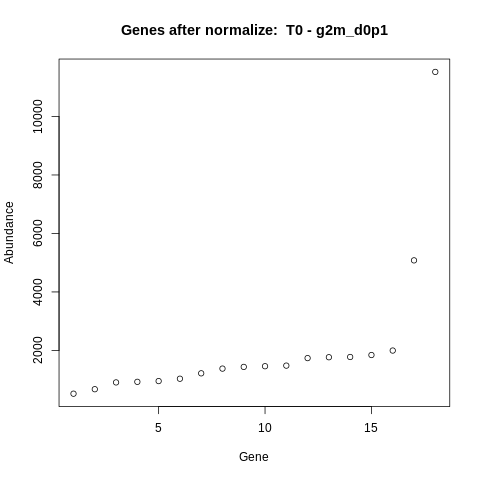

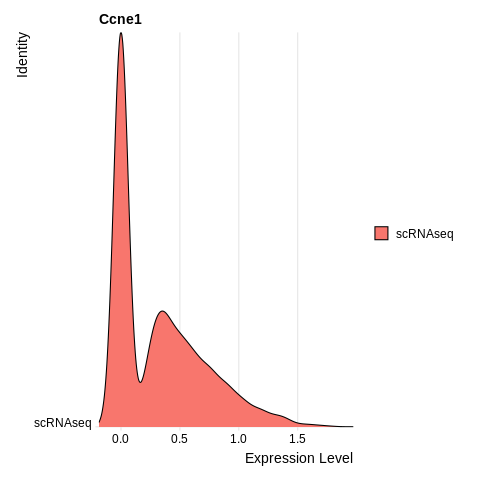

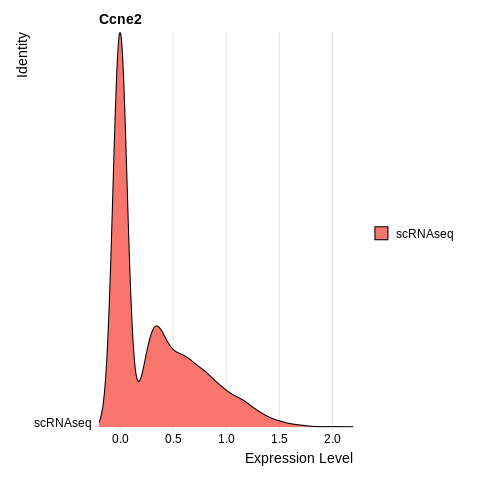

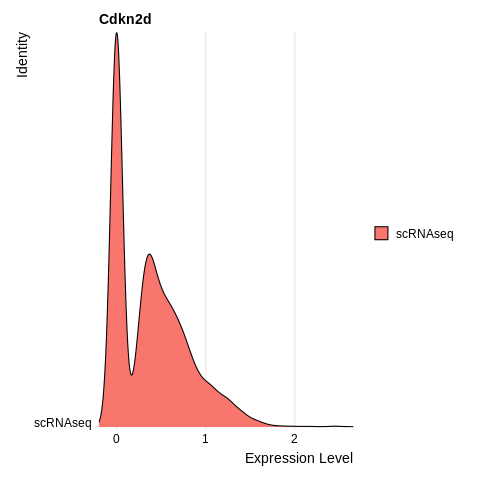

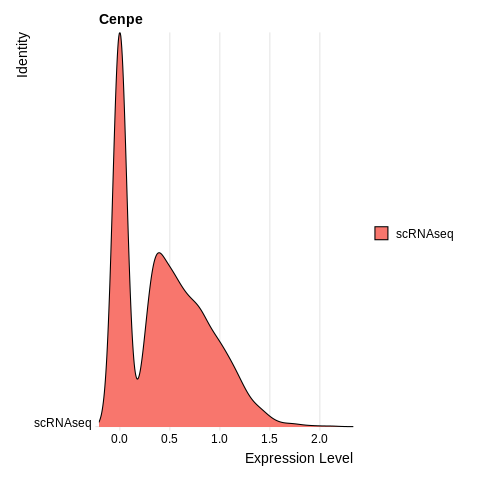

...

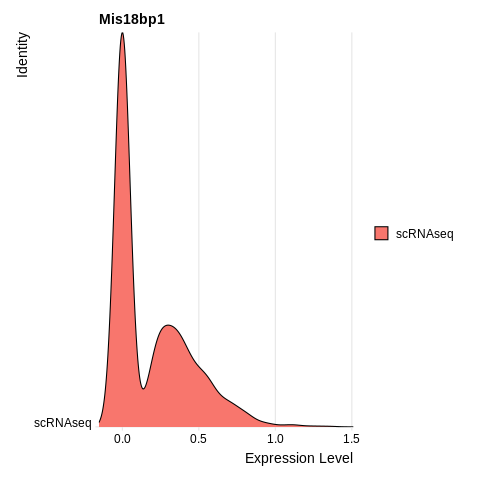

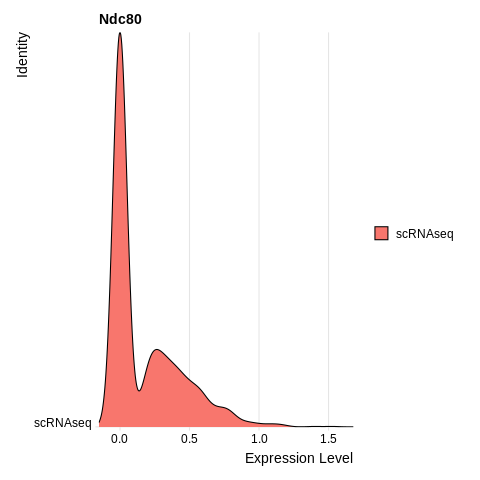

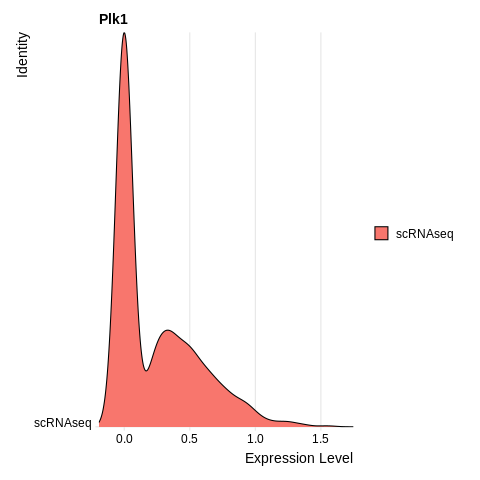

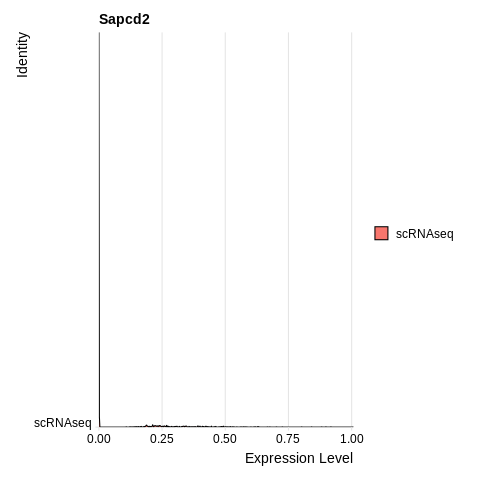

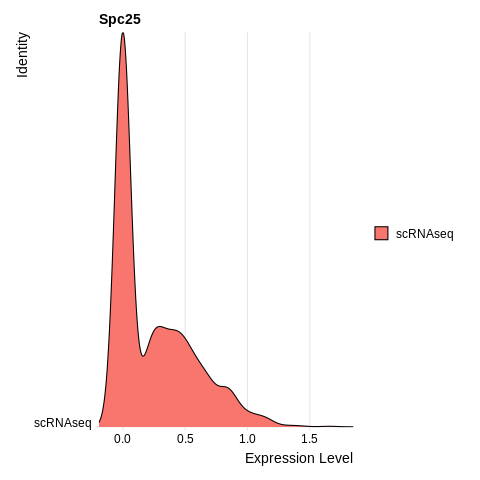

RInterpreterError: ignored

In [ ]:
%%R
# Explore the data
# S and G2M gene distributions

for (k in names(NORM)){  # For each sample
    print("-------------------------------------")
    print(k)
    for (LISTS in names(GENESnewLists)[1]){
        GENES <- GENESnewLists[[LISTS]]
        GENES <- rownames(NORM[[k]]@assays$RNA@counts)[rownames(NORM[[k]]@assays$RNA@counts) %in% GENES]
        print(LISTS)
        GENES <- c('Ccne1','Ccne2','Cdkn2d','Cenpe','Ckap2l','Depdc1a','Hist1h1b','Kif20b','Kif23','Kif4','Kpna2','Mis18bp1','Ndc80','Plk1','Sapcd2','Spc25','Ubb','Ung')
        # We select genes found in the data
        SEURt <- subset(NORM[[k]], features = GENES)  
        print(dim(SEURt))
        # We plot the counts for those genes (above)
        plot(sort(rowSums(SEURt@assays$RNA@counts)), xlab = "Gene", ylab = "Abundance", main = paste("Genes after normalize: ", k, "-", LISTS))   
        for (j in GENES){  # For each gene
            print(RidgePlot(SEURt, features = j, ncol = 1))   # Plot distribution for each gene
        }

    }
}

In the preparation of the data, we remove the predefined identities since those identities reflected the clustering methods. But, vizualize the genes' distributions in different sets of genes (different assigned phases in cells) can be useful. We can estimate if certain S genes are more expressed in S phase state cells. 

[1] "G1"  "G2M" "S"  
[1] "G1"  "G2M" "S"  
[1] "G1"  "G2M" "S"  


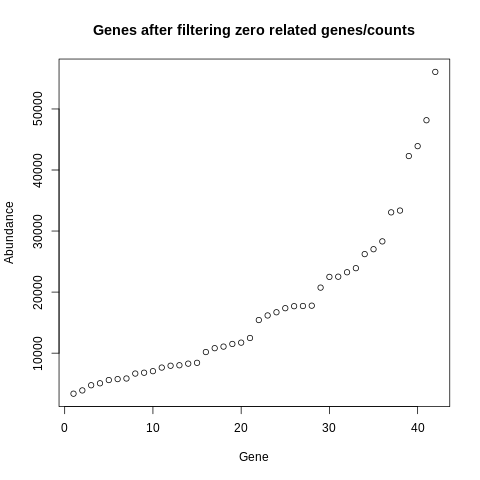

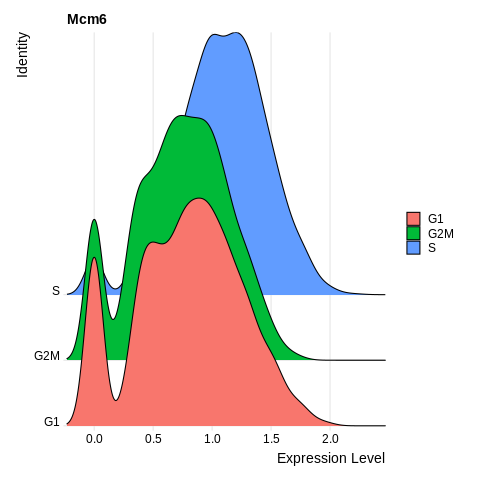

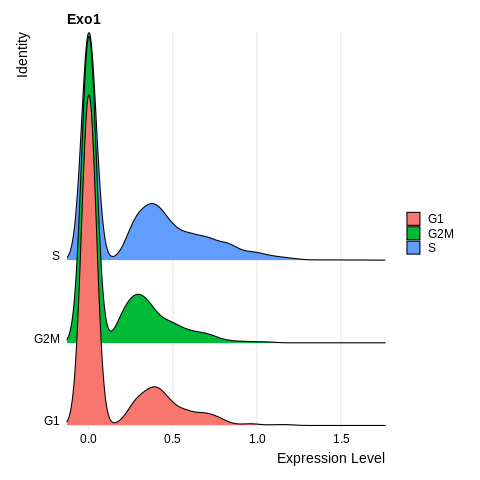

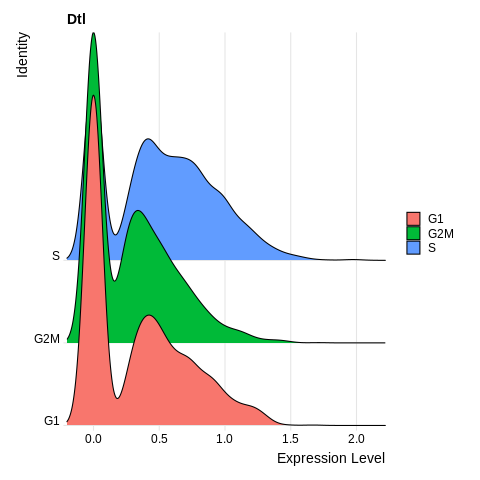

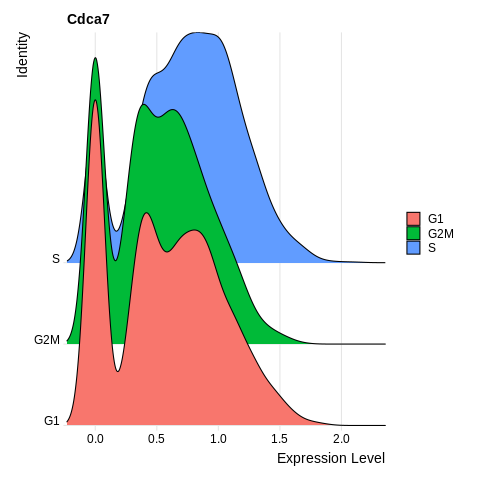

...

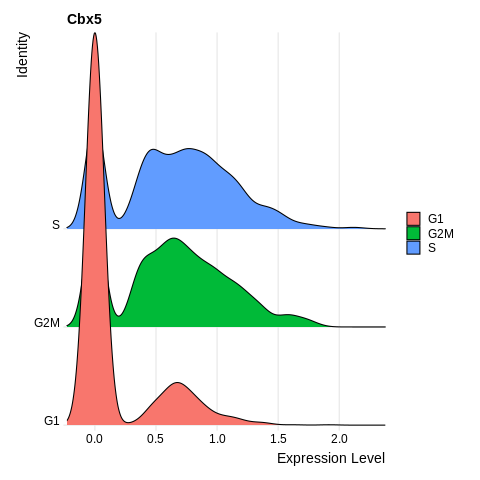

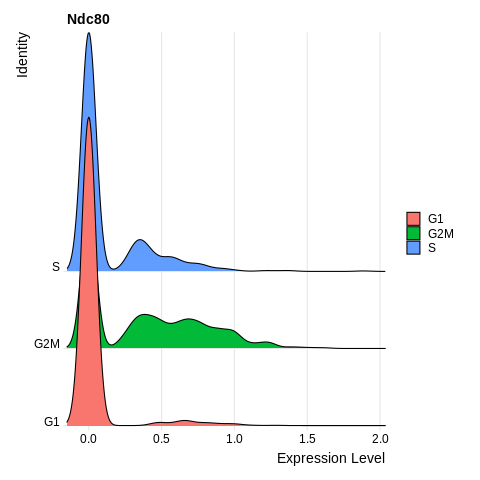

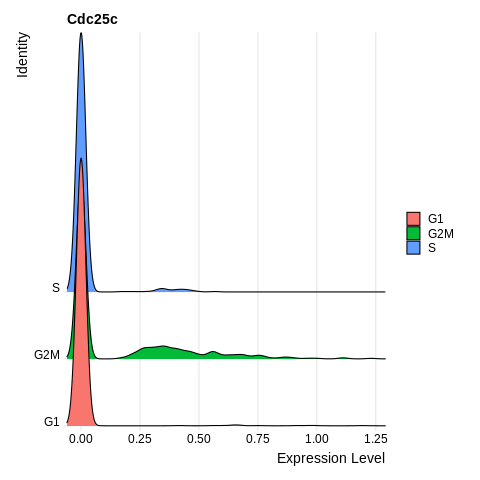

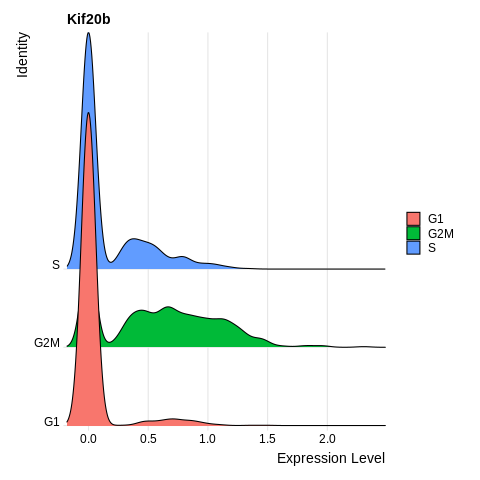

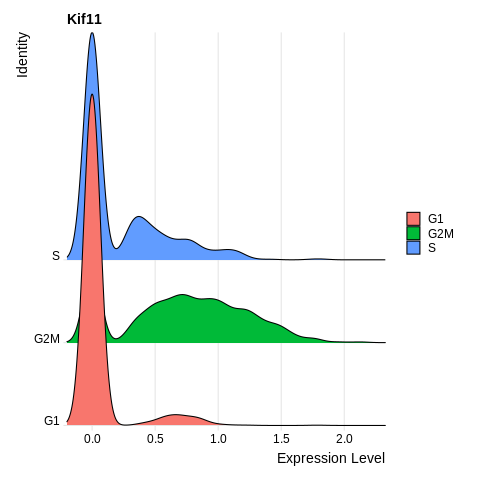

In [ ]:
%%R
# Prepare the data (Chage identities)
for (i in 1:length(NORM)){Idents(NORM[[i]]) <- NORM[[i]]@meta.data$Phase}
for (i in 1:length(NORM)){print(levels(NORM[[i]]))}

# Plot distributions
for (k in NORM){
    for (i in GENESzim){
        SEURt <- subset(k, features = rownames(k@assays$RNA@counts)[rownames(k@assays$RNA@counts) %in% i])
        plot(sort(rowSums(SEURt@assays$RNA@counts)), xlab = "Gene", ylab = "Abundance", main = "Genes after filtering zero related genes/counts")
        for (j in rownames(SEURt)){print(RidgePlot(SEURt, features = j, ncol = 1))}
    }
}

### Explore RNA content per cell

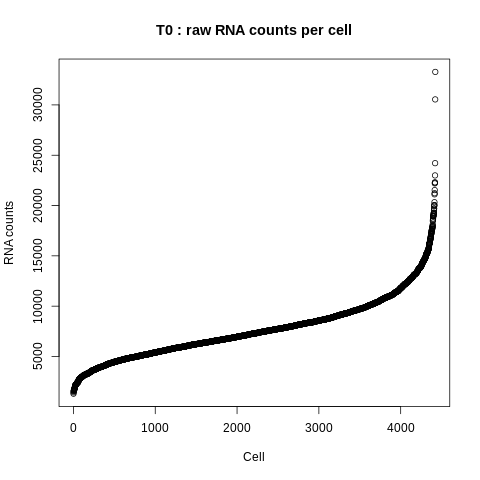

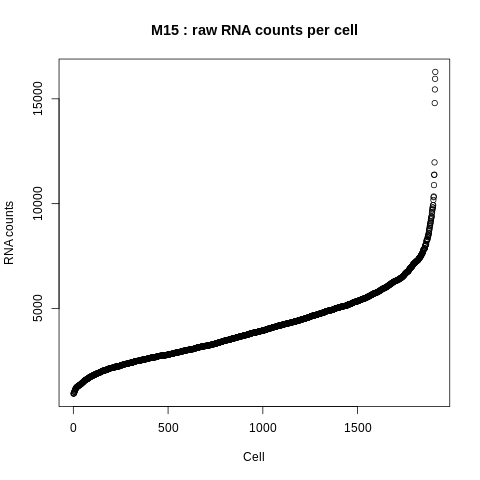

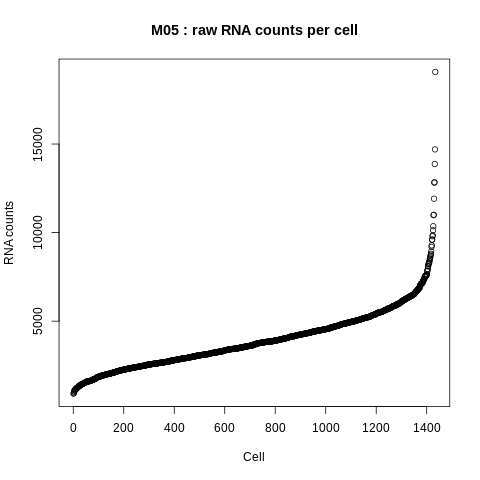

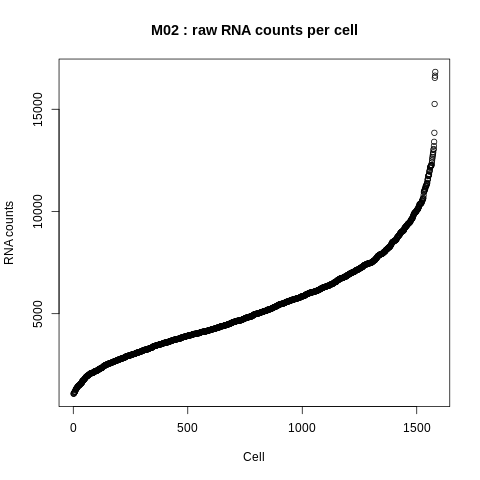

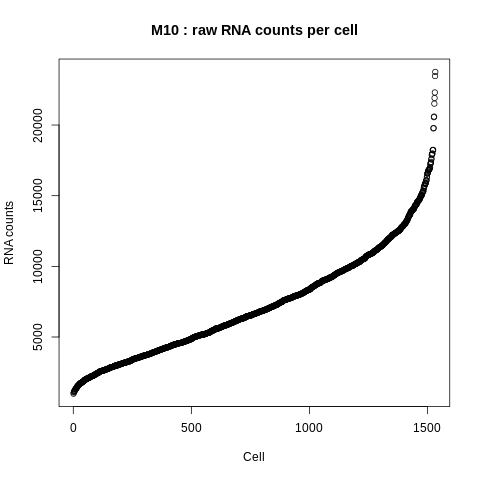

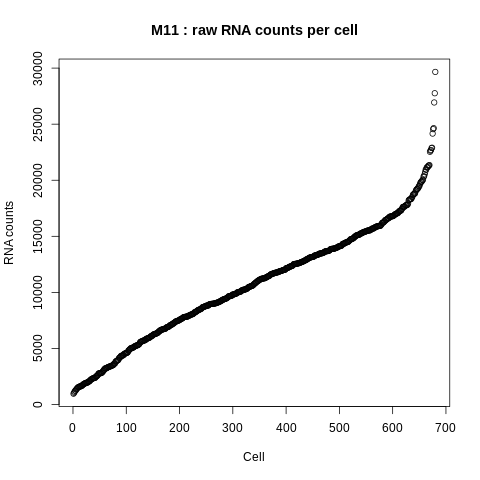

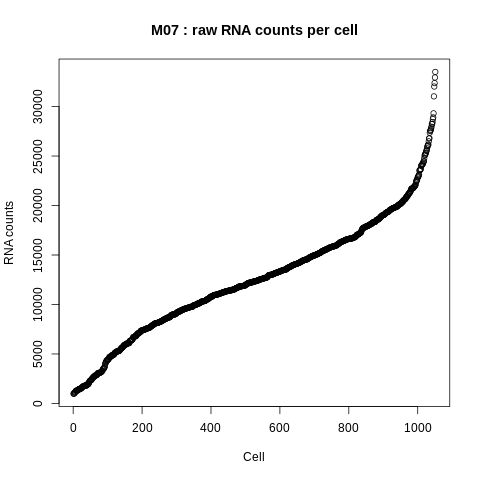

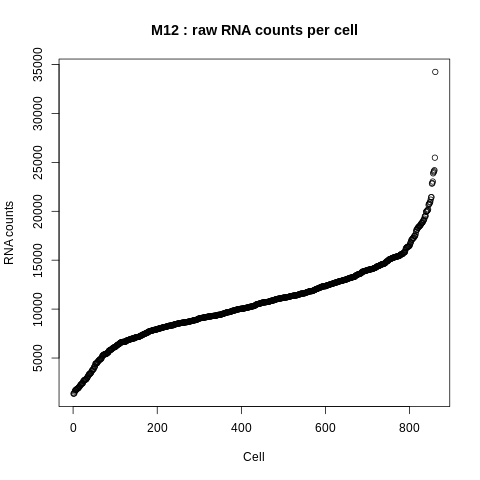

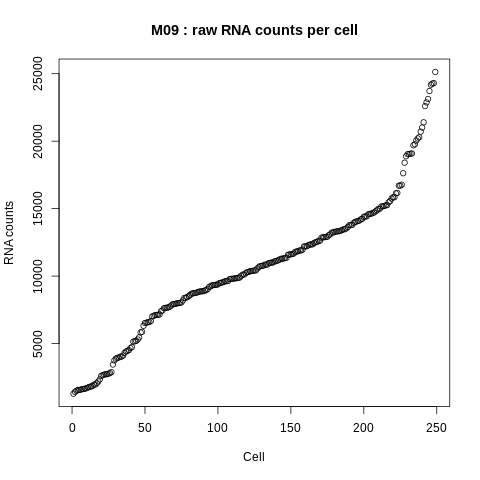

In [ ]:
%%R
# The RNA counts per cell using all genes
for (i in names(SEUR)){
    plot(sort(colSums(SEUR[[i]])), xlab = "Cell", ylab = "RNA counts", main = paste(i, ": raw RNA counts per cell"))
    #plot(sort(colSums(SEUR[[i]])), xlab = "Cell", ylab = "RNA counts", main = paste(i, ": normalized RNA counts per cell"))
}

### Explore RNA content per gene

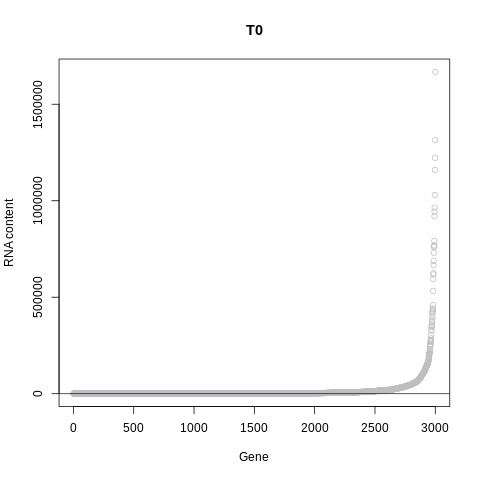

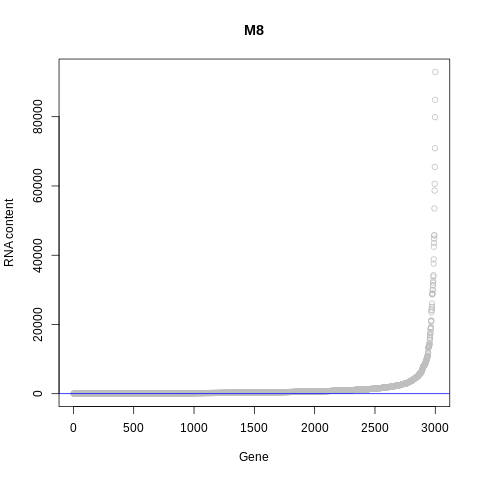

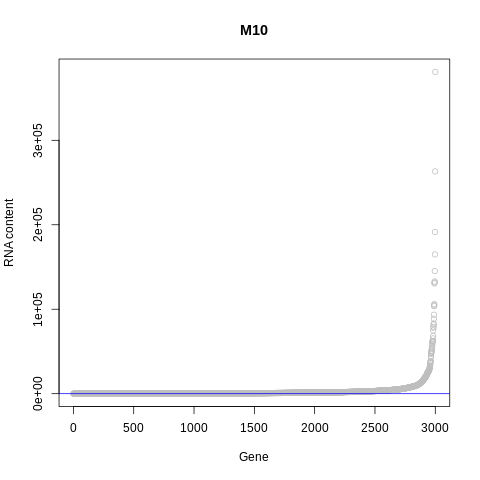

In [ ]:
%%R
for (i in 1:length(COUNTS)){plot(sort(rowSums(COUNTS[[i]])), 
                                 col = "gray", main = names(COUNTS)[i], 
                                 ylab = "RNA content", xlab = "Gene"); abline(h=0, col="blue")}

### Explore proportion of cells that express each gene.

This is particularly important since the scShapes classifier will only use genes that are expressed in more than 10% of cells (above blue line)

[1] 3000
[1] 53
[1] 97
[1] 3000
[1] 88
[1] 97
[1] 3000
[1] 90
[1] 97


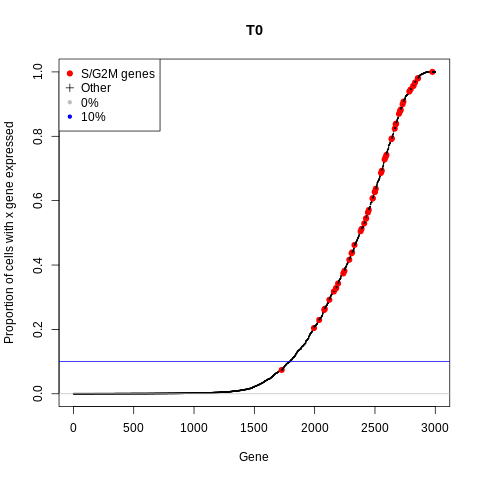

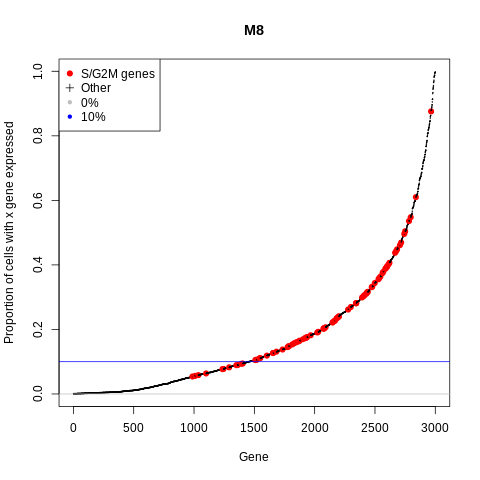

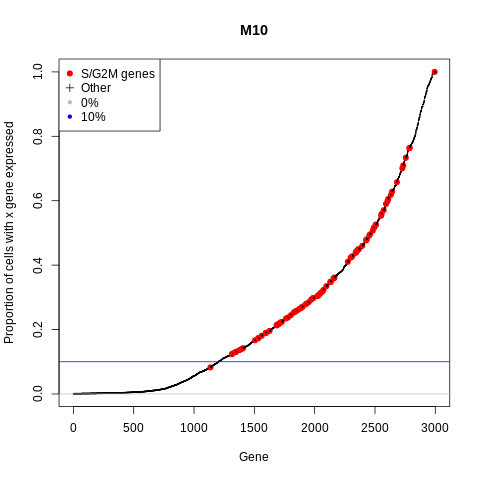

In [ ]:
%%R
for (i in 1:length(COUNTS)){
    PROP <- sort(rowSums(COUNTS[[i]]> 0)/ncol(COUNTS[[i]]))
    print(length(PROP))
    print(sum(names(PROP) %in% unlist(GENES)))
    print(length(unlist(GENES)))
    plot(PROP, col = ifelse(names(PROP) %in% unlist(GENES), "red", "black"), pch = ifelse(names(PROP) %in% unlist(GENES), 19, 3), 
         cex = ifelse(names(PROP) %in% unlist(GENES), 1, 0.1),  
         main = names(COUNTS)[i], ylab = "Proportion of cells with x gene expressed", xlab = "Gene")
    abline(h=0.1, col="blue"); abline(h=0, col="gray")
    legend("topleft", legend = c("S/G2M genes", "Other", "0%", "10%"), col=c("red", "black", "gray", "blue"), pch = c(19,3,20,20)) 
    }

### Violin plots for Sor G2M gene expression

In some cases, we can have differences in S and G2M genes. We can have a common classification for S which is different for G2M, or we can have a dominant type of genes in our clusters. The last can be a consequence of differences in RNA content in different sets of genes. Therefore, we must explore the differences.

In [ ]:
%%R
COUNTS <- lapply(SEUR, function (x) x@assays$RNA@counts)

[1] "T0"
[1] "M8"
[1] "M10"


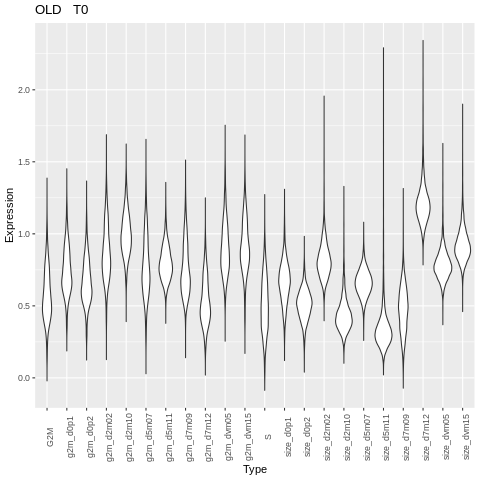

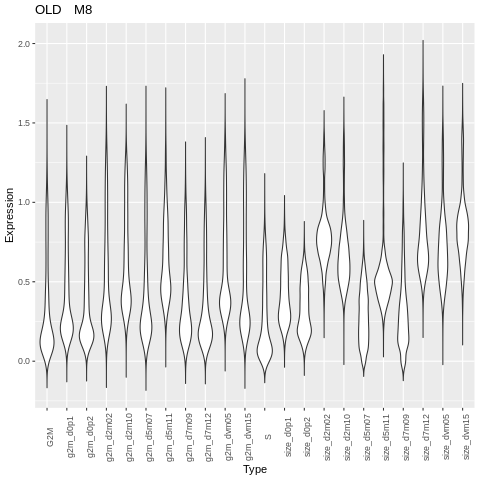

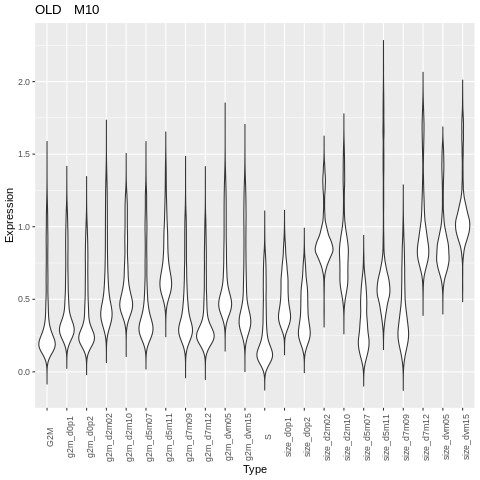

In [ ]:
%%R
WHICH <- OLDnew


for (SAMPLE in names(COUNTS)){
    print(SAMPLE)
    # Transform to ggplot format
    MEANexp <- data.frame(matrix(ncol=2,nrow=0, dimnames=list(NULL, c("Expression", "Type"))))   # This is the long format

    for (LIST in names(GENESnewLists)){
        genes <- GENESnewLists[[LIST]]
        
        #for (SAMPLE in names(COUNTS)){
            # For S and G2M genes, we select the value (mean), we add the extra data
            MEANexp <- rbind(MEANexp, cbind(Expression = colMeans(COUNTS[[SAMPLE]][genes[genes %in% row.names(COUNTS[[SAMPLE]])], ]), Type = LIST))
        #}
    }
    MEANexp$Expression <- as.numeric(MEANexp$Expression)
    print(ggplot(MEANexp, aes(x = Type, y = Expression)) + geom_violin(trim = FALSE) + ggtitle(paste(OLDnew, " ", SAMPLE)) + theme(axis.text.x = element_text(angle = 90))) 
}


In [ ]:
%%R
WHICH <- OLDnew
# Transform to ggplot format
MEANexp <- data.frame(matrix(ncol=4,nrow=0, dimnames=list(NULL, c("Expression", "Type", "Sample", "State"))))   # This is the long format
for (SAMPLE in names(COUNTS)){
    # For S and G2M genes, we select the value (mean), we add the extra data
    MEANexp <- rbind(MEANexp, cbind(Expression = colMeans(COUNTS[[SAMPLE]][G2Mgenes[G2Mgenes %in% row.names(COUNTS[[SAMPLE]])], ]), Type = "G2M", SAMPLE = SAMPLE, State = SAMPLESclass[[WHICH]][SAMPLE, "TYPE"]))
    MEANexp <- rbind(MEANexp, cbind(Expression = colMeans(COUNTS[[SAMPLE]][Sgenes[Sgenes %in% row.names(COUNTS[[SAMPLE]])], ]), Type = "S", SAMPLE = SAMPLE, State = SAMPLESclass[[WHICH]][SAMPLE, "TYPE"]))    
}
MEANexp$Expression <- as.numeric(MEANexp$Expression)



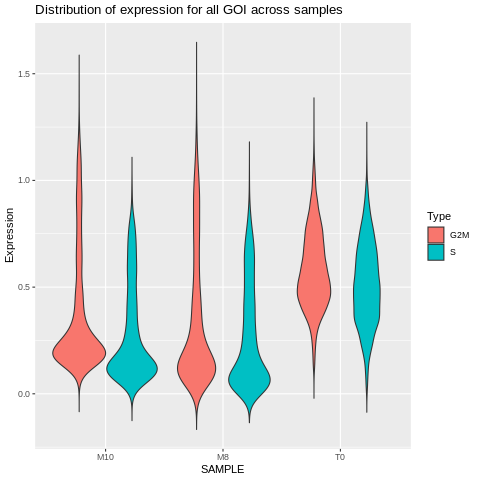

In [ ]:
%%R
ggplot(MEANexp, aes(x = SAMPLE, y = Expression, fill = Type)) + geom_violin(trim = FALSE) + ggtitle("Distribution of expression for all GOI across samples")